### Importing Necessary Libraries

In [128]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor, plot_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from keras import optimizers
from keras.models import Sequential, Model
from keras.layers.convolutional import Conv1D, MaxPooling1D
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Flatten
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import BayesianRidge
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.ensemble import StackingRegressor

### Data Information

In [51]:
data = pd.read_csv("powerconsumption.csv")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52416 entries, 0 to 52415
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Datetime                52416 non-null  object 
 1   Temperature             52416 non-null  float64
 2   Humidity                52416 non-null  float64
 3   WindSpeed               52416 non-null  float64
 4   GeneralDiffuseFlows     52416 non-null  float64
 5   DiffuseFlows            52416 non-null  float64
 6   PowerConsumption_Zone1  52416 non-null  float64
 7   PowerConsumption_Zone2  52416 non-null  float64
 8   PowerConsumption_Zone3  52416 non-null  float64
dtypes: float64(8), object(1)
memory usage: 3.6+ MB


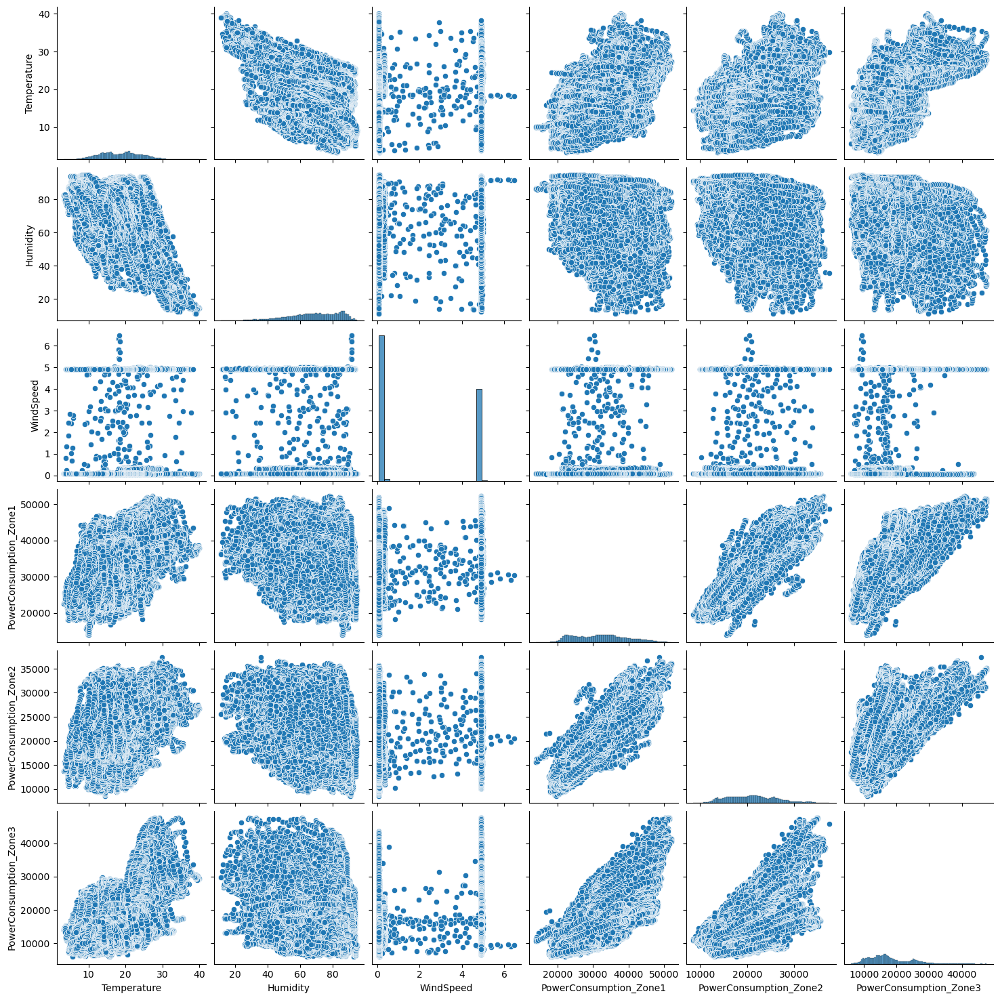

In [52]:
sns.pairplot(data[['Temperature', 'Humidity', 'WindSpeed', 'PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3']])
plt.show()

### Data Preprocessing

In [53]:
data["Datetime"] = pd.to_datetime(data.Datetime)
data.sort_values(by= "Datetime", ascending = True, inplace = True)

chronological_order = data["Datetime"].is_monotonic_increasing

time_difference = data["Datetime"].diff()
timestamps = time_difference.nunique() == 1

chronological_order, timestamps

(True, True)

### Feature Engineering

In [54]:
def create_features(data):
    """
    Create time series features based on time series index.
    """
    data = data.copy()
    data['hour'] = data.index.hour
    data['minute'] = data.index.minute
    data['dayofweek'] = data.index.dayofweek
    data['quarter'] = data.index.quarter
    data['month'] = data.index.month
    data['day'] = data.index.month
    data['year'] = data.index.year
    data['season'] = data['month'] % 12 // 3 + 1
    data['dayofyear'] = data.index.dayofyear
    data['dayofmonth'] = data.index.day
    data['weekofyear'] = data.index.isocalendar().week

    data['is_weekend'] = data['dayofweek'].isin([5, 6]).astype(int)
    data['is_month_start'] = (data['dayofmonth'] == 1).astype(int)
    data['is_month_end'] = (data['dayofmonth'] == data.index.days_in_month).astype(int)
    data['is_quarter_start'] = (data['dayofmonth'] == 1) & (data['month'] % 3 == 1).astype(int)
    data['is_quarter_end'] = (data['dayofmonth'] == data.groupby(['year', 'quarter'])['dayofmonth'].transform('max'))
    
    # Additional features
    data['is_working_day'] = data['dayofweek'].isin([0, 1, 2, 3, 4]).astype(int)
    data['is_business_hours'] = data['hour'].between(9, 17).astype(int)
    data['is_peak_hour'] = data['hour'].isin([8, 12, 18]).astype(int)
    
    # Minute-level features
    data['minute_of_day'] = data['hour'] * 60 + data['minute']
    data['minute_of_week'] = (data['dayofweek'] * 24 * 60) + data['minute_of_day']
    
    return data.astype(float)

In [55]:
data = data.set_index('Datetime')
data = create_features(data)

In [56]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52416 entries, 2017-01-01 00:00:00 to 2017-12-30 23:50:00
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Temperature             52416 non-null  float64
 1   Humidity                52416 non-null  float64
 2   WindSpeed               52416 non-null  float64
 3   GeneralDiffuseFlows     52416 non-null  float64
 4   DiffuseFlows            52416 non-null  float64
 5   PowerConsumption_Zone1  52416 non-null  float64
 6   PowerConsumption_Zone2  52416 non-null  float64
 7   PowerConsumption_Zone3  52416 non-null  float64
 8   hour                    52416 non-null  float64
 9   minute                  52416 non-null  float64
 10  dayofweek               52416 non-null  float64
 11  quarter                 52416 non-null  float64
 12  month                   52416 non-null  float64
 13  day                     52416 non-null  float64
 14  yea

In [57]:
data[[ 'year', 'month', 'day','minute', 'dayofyear', 'weekofyear', 'quarter', 'season']].head()

,year,month,day,minute,dayofyear,weekofyear,quarter,season
Datetime,,,,,,,,
2017-01-01 00:00:00,2017.0,1.0,1.0,0.0,1.0,52.0,1.0,1.0
2017-01-01 00:10:00,2017.0,1.0,1.0,10.0,1.0,52.0,1.0,1.0
2017-01-01 00:20:00,2017.0,1.0,1.0,20.0,1.0,52.0,1.0,1.0
2017-01-01 00:30:00,2017.0,1.0,1.0,30.0,1.0,52.0,1.0,1.0
2017-01-01 00:40:00,2017.0,1.0,1.0,40.0,1.0,52.0,1.0,1.0


### EDA

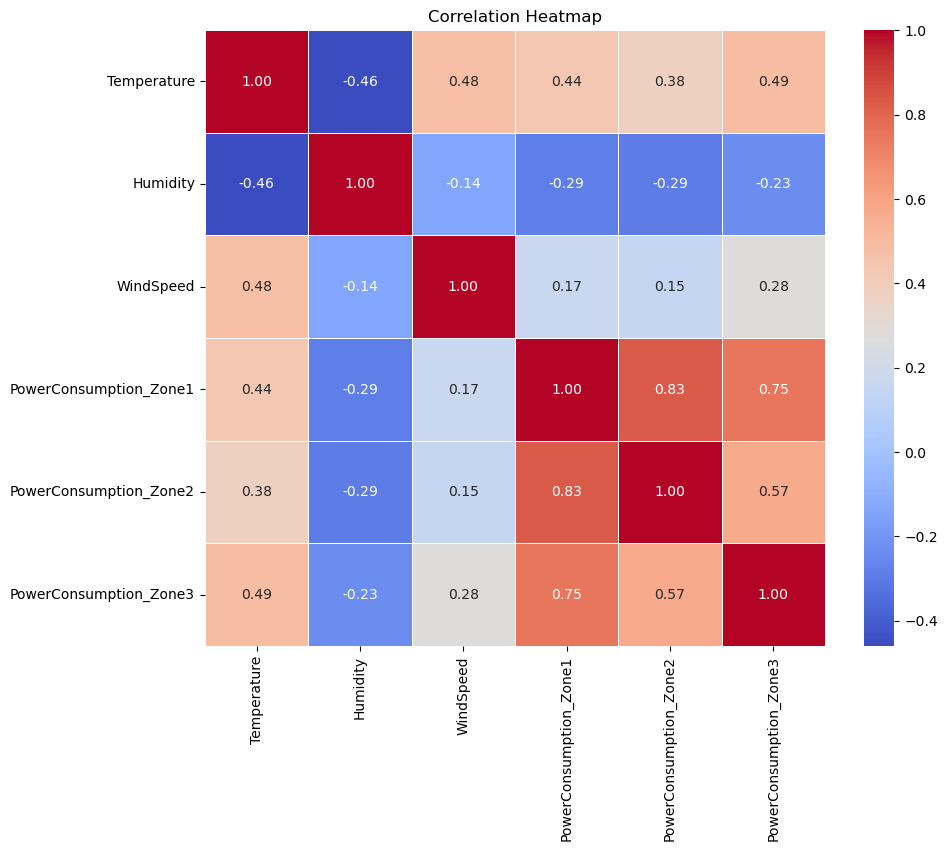

In [58]:
# Calculate correlation matrix
correlation_matrix = data[['Temperature', 'Humidity', 'WindSpeed', 'PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3']].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

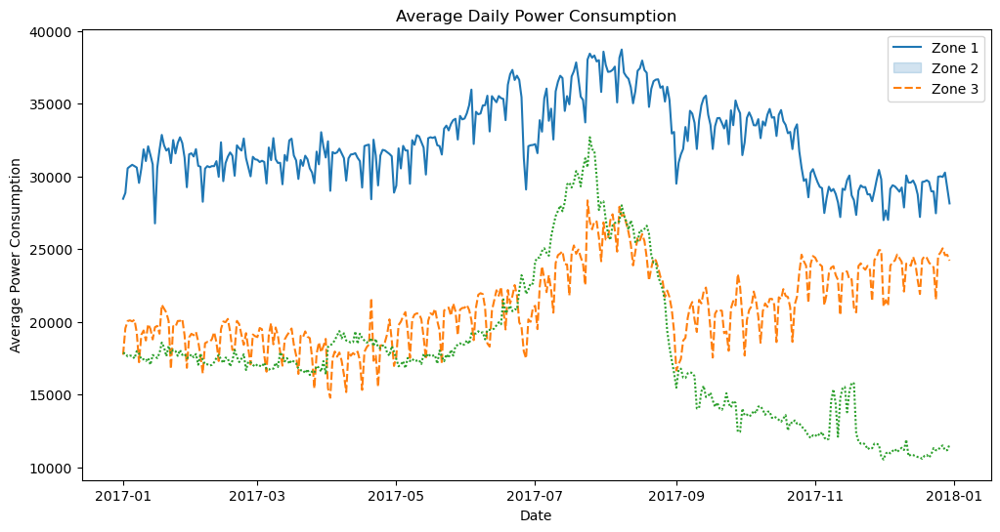

In [59]:
# Resample the data for more meaningful time series analysis (e.g., daily, weekly)
daily_resampled = data.resample('D').mean()

# Plot daily Power Consumption for each zone
plt.figure(figsize=(12, 6))
sns.lineplot(data=daily_resampled[['PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3']])
plt.xlabel('Date')
plt.ylabel('Average Power Consumption')
plt.title('Average Daily Power Consumption')
plt.legend(labels=['Zone 1', 'Zone 2', 'Zone 3'])
plt.show()

# Models

In [117]:
# Separate the input features (X) and target variables (y)
X = data.drop(['PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3'], axis=1)
y = data[['PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3']]

# Initialize StandardScaler for X and y
scaler_X = StandardScaler()
scaler_y = StandardScaler()

# Fit and transform X and y
X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.25, shuffle=False)

### Evaluation Metric 

In [97]:
def evaluate(y_true, y_pred):
    # Mean Squared Error
    mse = mean_squared_error(y_true, y_pred)
    
    # Root Mean Squared Error
    rmse = np.sqrt(mse)
    
    # Mean Absolute Error
    mae = mean_absolute_error(y_true, y_pred)
    
    # R-squared
    r2 = r2_score(y_true, y_pred)
    
    epsilon = 1e-10  # small constant to avoid division by zero
    mape = np.mean(np.abs((y_true - y_pred) / (y_true + epsilon))) * 100
    
    # Mean Bias Error
    mbe = np.mean(y_pred - y_true)
    
    return mse, rmse, mae, r2, mape, mbe

In [62]:
def plot_power_consumption(y_test_original, y_test_pred_original):
    """
    Plots actual vs predicted power consumption for Zone 1, Zone 2, and Zone 3.

    Parameters:
    - y_test_original: numpy array, actual values with shape (n_samples, n_zones)
    - y_test_pred_original: numpy array, predicted values with shape (n_samples, n_zones)
    """
    plt.figure(figsize=(15, 15))

    # Plot for Zone 1
    plt.subplot(3, 1, 1)
    plt.plot(y_test[:, 0], label='Actual PowerConsumption_Zone1')
    plt.plot(y_test_pred[:, 0], label='Predicted PowerConsumption_Zone1')
    plt.xlabel('Sample Index')
    plt.ylabel('Power Consumption Zone 1')
    plt.legend()
    plt.title('Actual vs Predicted Power Consumption Zone 1')

    # Plot for Zone 2
    plt.subplot(3, 1, 2)
    plt.plot(y_test[:, 1], label='Actual PowerConsumption_Zone2')
    plt.plot(y_test_pred[:, 1], label='Predicted PowerConsumption_Zone2')
    plt.xlabel('Sample Index')
    plt.ylabel('Power Consumption Zone 2')
    plt.legend()
    plt.title('Actual vs Predicted Power Consumption Zone 2')

    # Plot for Zone 3
    plt.subplot(3, 1, 3)
    plt.plot(y_test[:, 2], label='Actual PowerConsumption_Zone3')
    plt.plot(y_test_pred[:, 2], label='Predicted PowerConsumption_Zone3')
    plt.xlabel('Sample Index')
    plt.ylabel('Power Consumption Zone 3')
    plt.legend()
    plt.title('Actual vs Predicted Power Consumption Zone 3')

    # Adjust layout to prevent overlapping
    plt.tight_layout()

    # Show the plots
    plt.show()

### Ordinary Least squares

In [175]:
model_ols = LinearRegression()
model_ols.fit(X_train, y_train)

# Make predictionsa
#y_train_pred = model.predict(X_train)
y_test_pred = model_ols.predict(X_test)

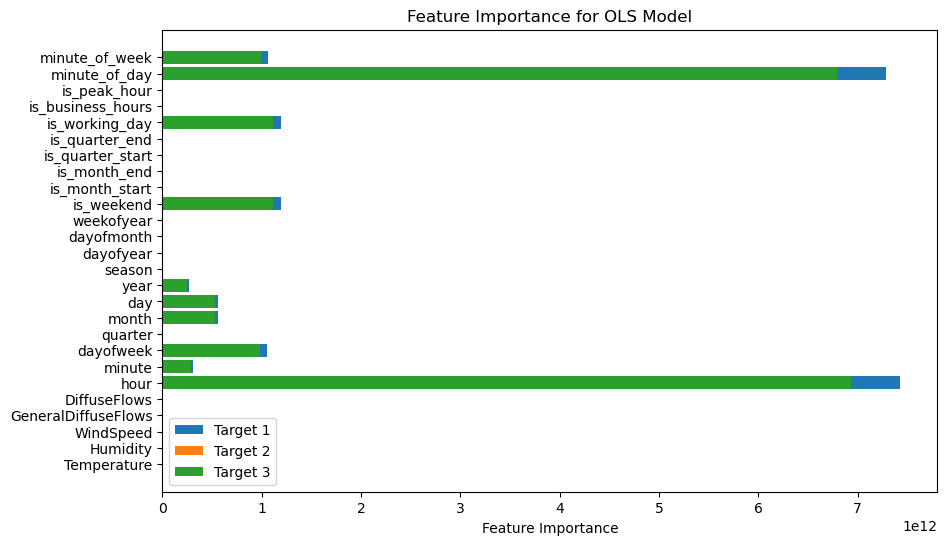

In [178]:
feature_names = X.columns
ols_coefficients = np.abs(model_ols.coef_) 
# Plotting OLS Feature Importance
plt.figure(figsize=(10, 6))
for i in range(ols_coefficients.shape[0]):
    plt.barh(feature_names, ols_coefficients[i], label=f"Target {i + 1}")

plt.xlabel('Feature Importance')
plt.title('Feature Importance for OLS Model')
plt.legend()
plt.show()

In [98]:
#Evaluation
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_test_pred)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.4767098247977774
RMSE: 0.6904417606125642
MAE: 0.5489918955401983
R²: 0.029592476576665788
MAPE: 318.3123324897613%
MBE: 0.08507688193648633


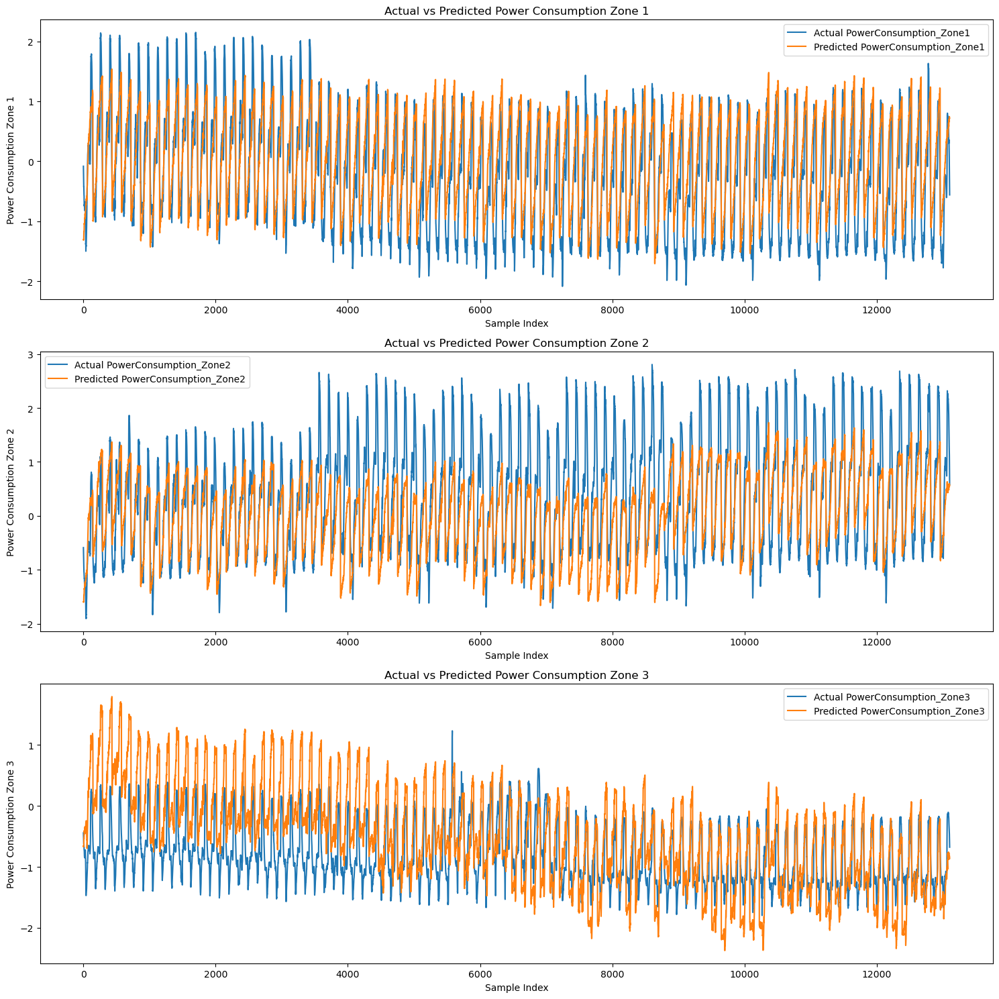

In [65]:
plot_power_consumption(y_test, y_test_pred)

### Polynomial Regression

In [118]:
degree = 2  # You can adjust the degree as needed
poly = PolynomialFeatures(degree=degree)

X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

model = LinearRegression()

model.fit(X_train_poly, y_train)

# Make predictions on the test data
y_pred_poly = model.predict(X_test_poly)

In [120]:
#Evaluation
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_pred_poly)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 1.3773025585699666e+21
RMSE: 37112027141.7497
MAE: 15804459090.475618
R²: -3.3778963209367863e+21
MAPE: 7254672060959.102%
MBE: 7524255825.514467


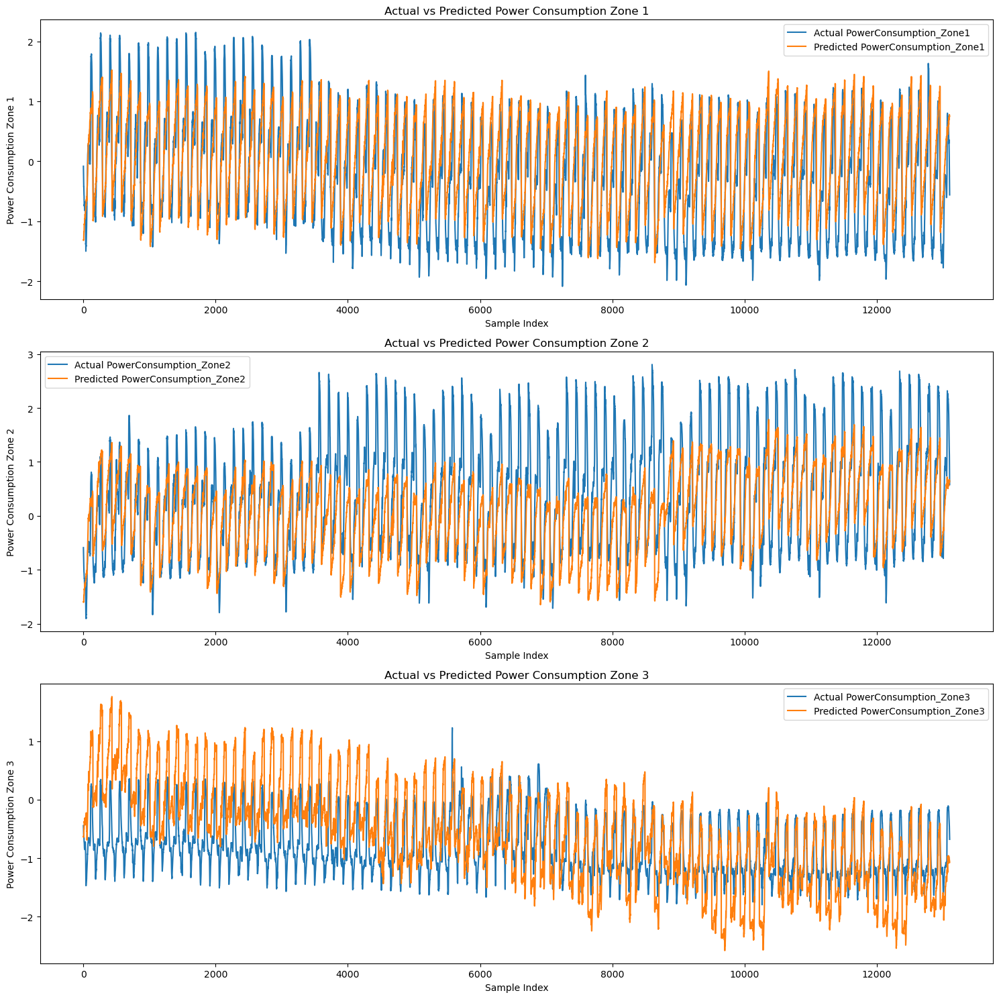

In [121]:
plot_power_consumption(y_test, y_pred_poly)

### Random forest

In [82]:
model = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, max_depth=10, n_jobs=-1, random_state=0))
model.fit(X_train, y_train)

# Make predictions
#y_train_pred = model.predict(X_train)
y_test_pred_R = model.predict(X_test)

In [99]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_test_pred_R)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.31814524821391826
RMSE: 0.5640436580743713
MAE: 0.441197792614416
R²: 0.5223139223464068
MAPE: 278.1979800855351%
MBE: 0.10502244360734662


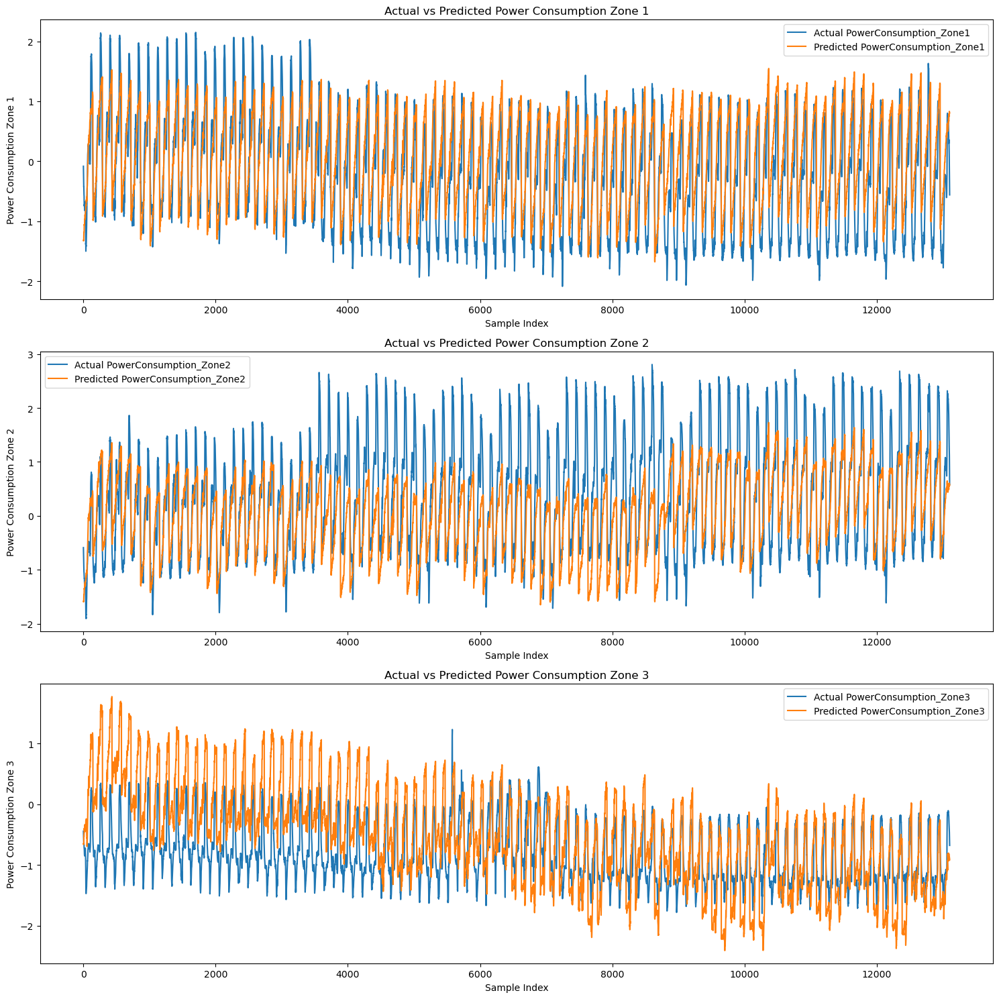

In [84]:
plot_power_consumption(y_test, y_test_pred_R)

### Bayesian Regression

In [179]:
# Initialize and fit Bayesian Ridge regression model within MultiOutputRegressor
model_BR = MultiOutputRegressor(BayesianRidge())
model_BR.fit(X_train, y_train)

# Make predictions
#y_train_pred = model.predict(X_train)
y_test_pred_B = model_BR.predict(X_test)

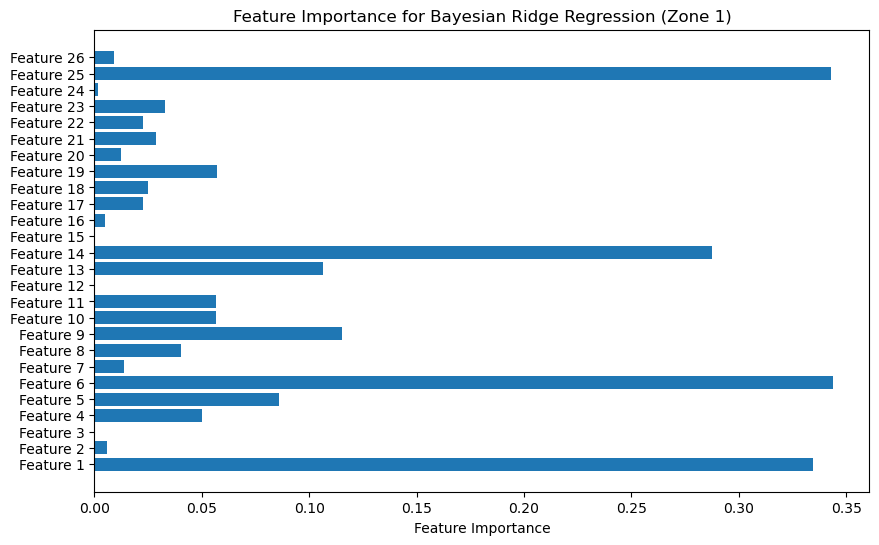

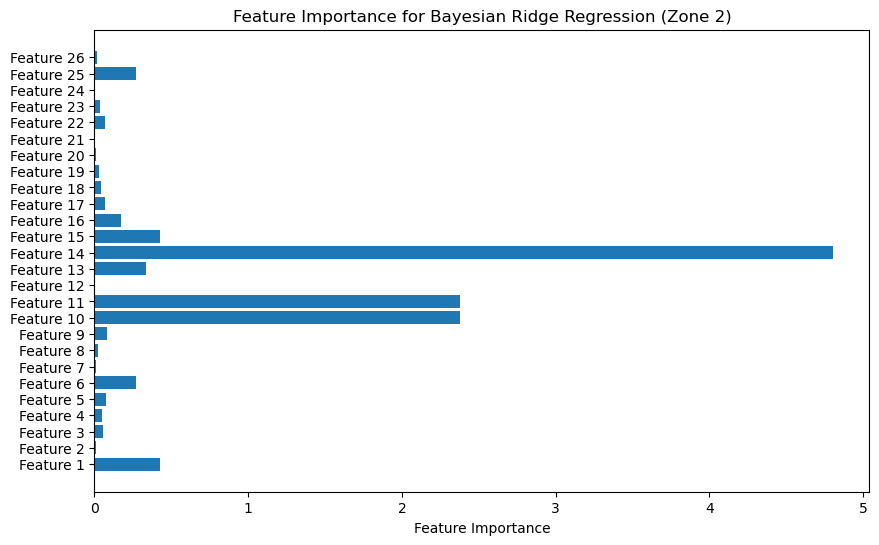

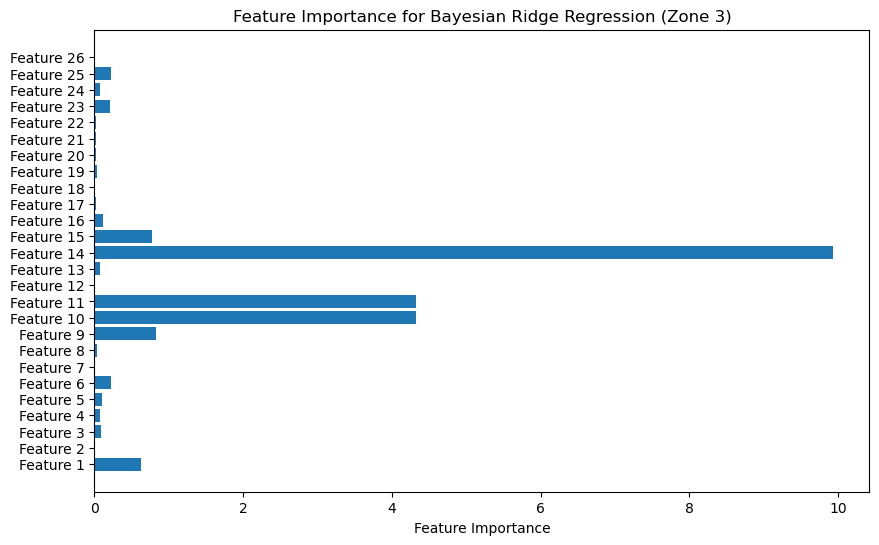

In [79]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_test_pred_B)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.48005644667384884
RMSE: 0.6928610587079121
MAE: 0.5496511917409895
R²: 0.03891172879053025
MAPE: 323.7602228956617%
MBE: 0.10125437676559222


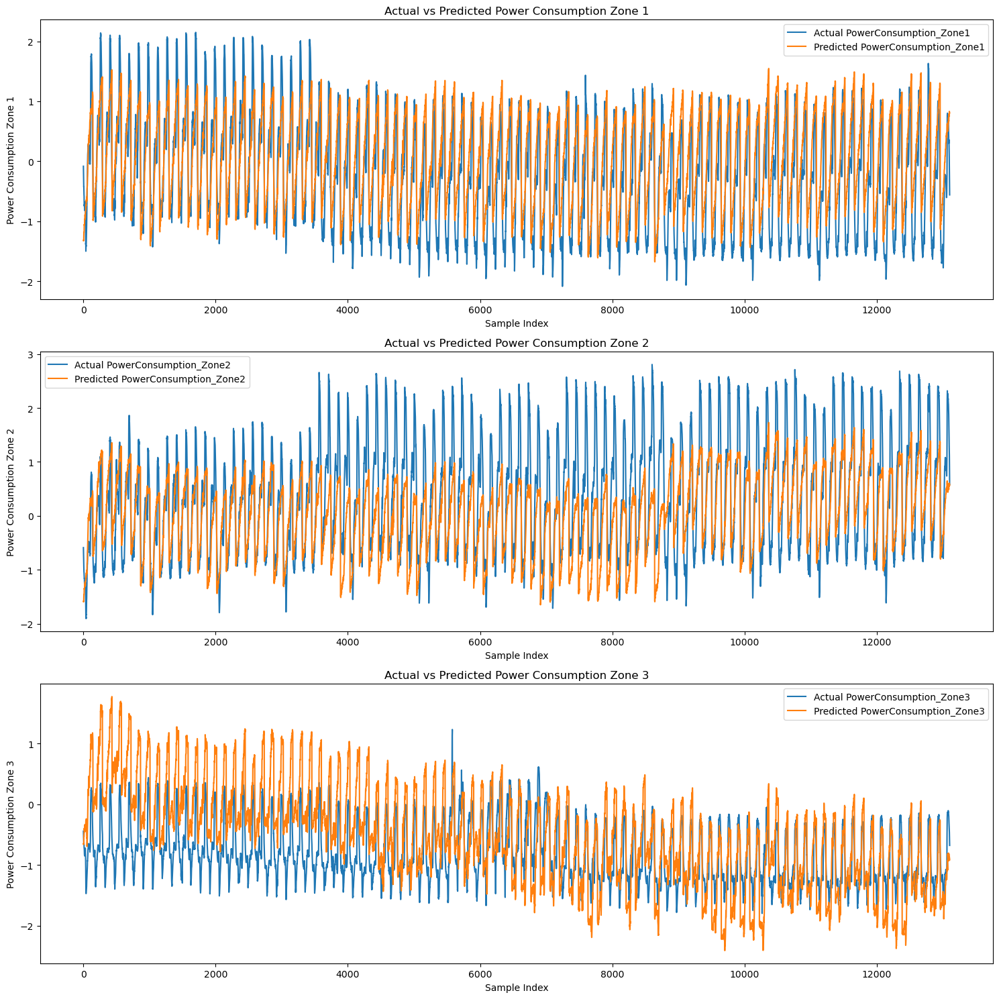

In [80]:
plot_power_consumption(y_test, y_test_pred_B)

### Bosting Trees

In [88]:
model = MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=0))
model.fit(X_train, y_train)

# Make predictions
#y_train_pred = model.predict(X_train)
y_test_pred_Bs = model.predict(X_test)

In [90]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_test_pred_Bs)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.27334421119108937
RMSE: 0.5228233078116252
MAE: 0.4167596011906114
R²: 0.5828785215718496
MAPE: 276.6866505846538%
MBE: 0.06715157923082302


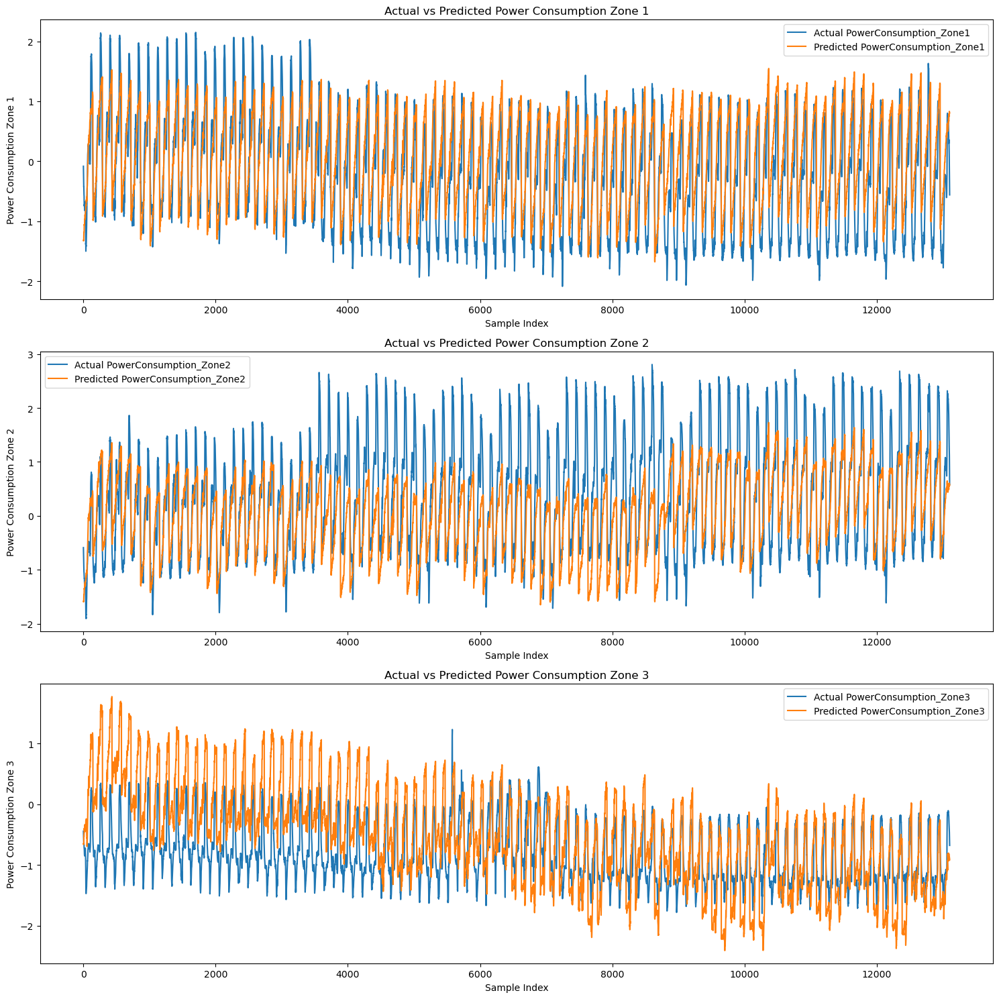

In [91]:
plot_power_consumption(y_test, y_test_pred_Bs)

### Support Vector Regression

In [124]:
svr = SVR(kernel='rbf', C=0.1, epsilon=0.01)
# Wrap SVR with MultiOutputRegressor to handle multiple output targets
model = MultiOutputRegressor(svr)

model.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred_SVR = model.predict(X_test)

In [125]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_test_pred_SVR)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.549685032836076
RMSE: 0.7414074674806532
MAE: 0.5906281460528606
R²: -0.10401971624561612
MAPE: 344.04305465142556%
MBE: 0.09144465814577947


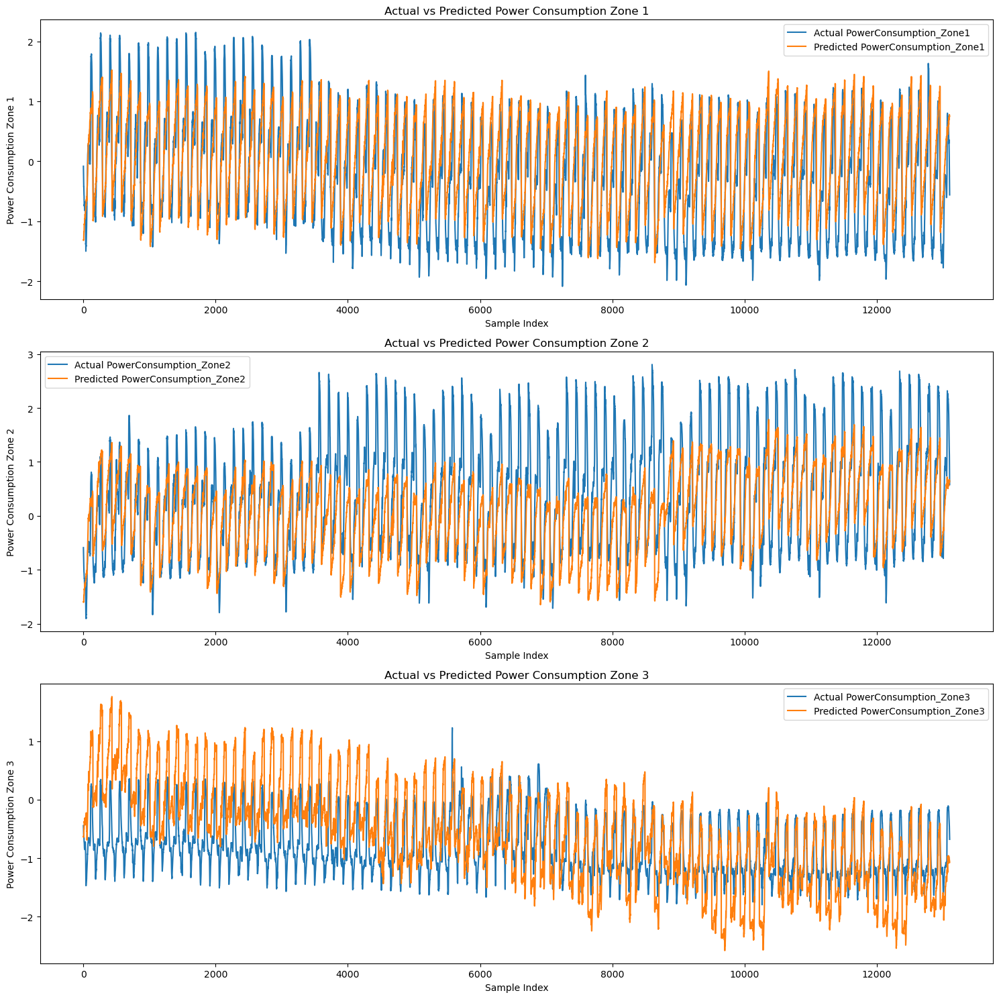

In [126]:
plot_power_consumption(y_test, y_test_pred_Bs)

### Least Squares SVM (LS-SVM)

In [95]:
model = MultiOutputRegressor(Ridge(alpha=1.0))
model.fit(X_train, y_train)

# Make predictions
#y_train_pred = model.predict(X_train)
y_test_pred_LS= model.predict(X_test)


In [96]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_test_pred_LS)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.4767098247977774
RMSE: 0.6904417606125642
MAE: 0.5489918955401983
R²: 0.029592476576665788
MAPE: 318.31222239361136%
MBE: 0.08507688193648633


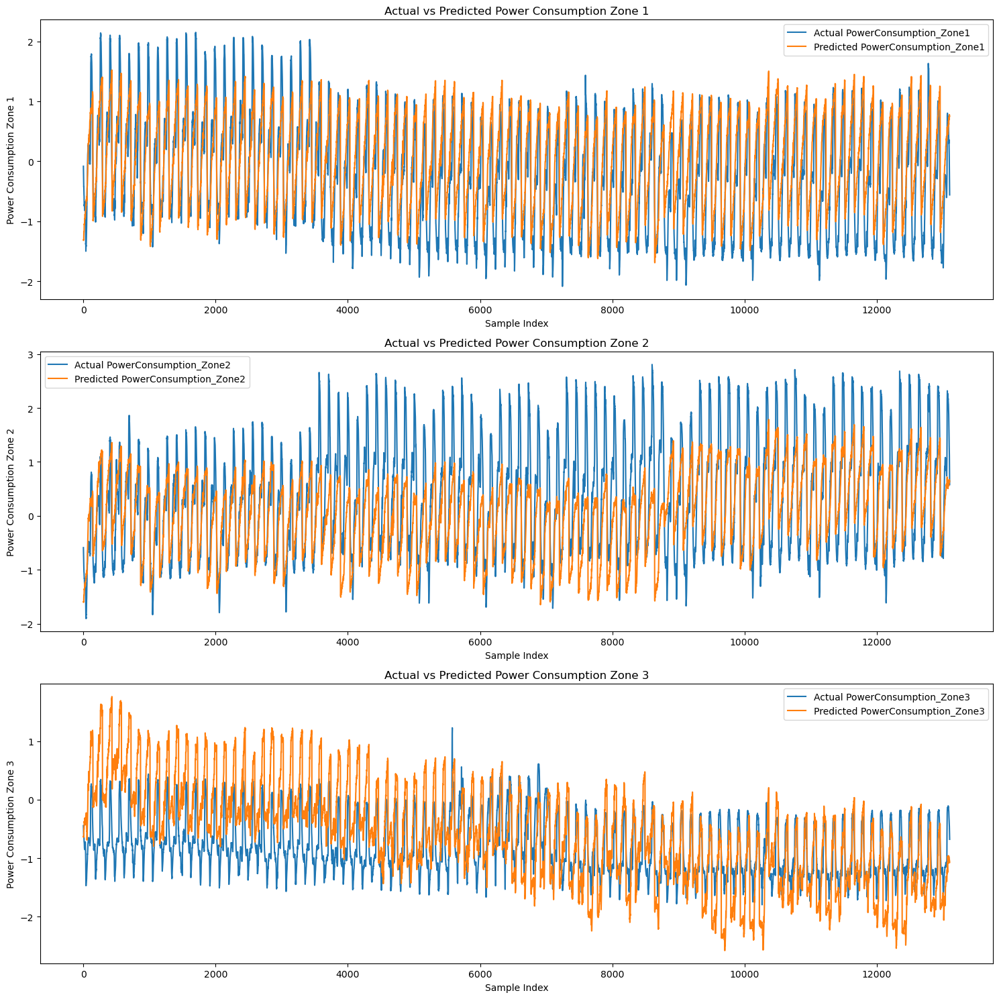

In [100]:
plot_power_consumption(y_test, y_test_pred_Bs)

### Xgboost

In [156]:
# Define the XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=6, learning_rate=0.1, subsample=0.8, colsample_bytree=0.8, random_state=0)

# Wrap the XGBoost model with MultiOutputRegressor to handle multiple output targets
model_xgb = MultiOutputRegressor(xgb_model)

# Train the model
model_xgb.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred_xgb = model_xgb.predict(X_test)

In [157]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_test_pred_xgb)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.2631196224112828
RMSE: 0.5129518714375481
MAE: 0.4076724861857451
R²: 0.600792445809898
MAPE: 270.58784702869633%
MBE: 0.09903549417822509


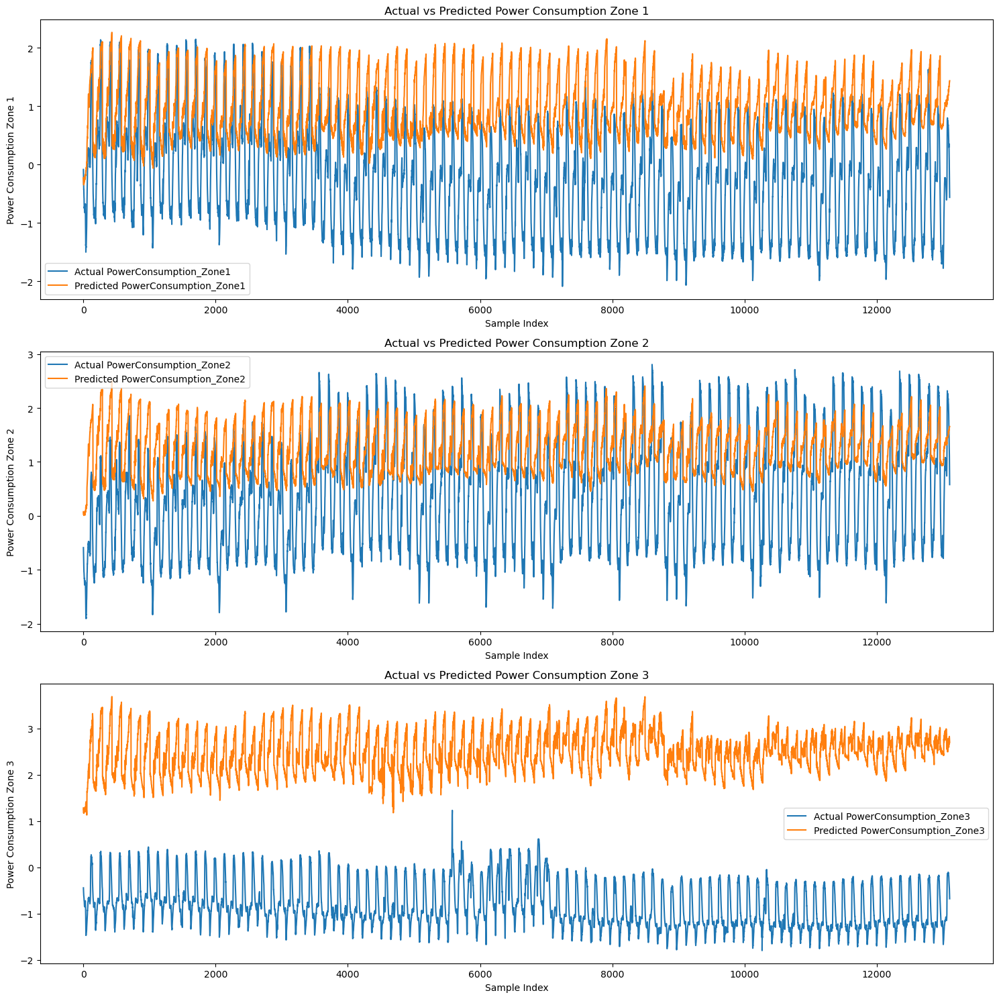

In [158]:
plot_power_consumption(y_test, y_test_pred_xgb)

### ARIMA

In [167]:
y_zone1 = data[['PowerConsumption_Zone1']]

# Initialize the scaler
scaler_y_zone1 = StandardScaler()

# Scale the target variable
y_zone1_scaled = scaler_y_zone1.fit_transform(y_zone1)

# Split the data into training and testing sets (75% train, 25% test)
train_size = int(len(y_zone1_scaled) * 0.75)
train, test = y_zone1_scaled[:train_size], y_zone1_scaled[train_size:]

# Fit the ARIMA model on the scaled training data
model_arima = ARIMA(train, order=(5,1,2))  # Example ARIMA order, you may need to tune these parameters
model_arima_fit = model_arima.fit()

# Make predictions on the test set
test_pred_arima_scaled = model_arima_fit.forecast(steps=len(test))

In [165]:
mse, rmse, mae, r2, mape, mbe = evaluate(test, test_pred_arima_scaled)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.8325034549131055
RMSE: 0.9124162728234879
MAE: 0.7524327982602921
R²: -0.015602290543231145
MAPE: 351.40863643587636%
MBE: -0.1126390654618874


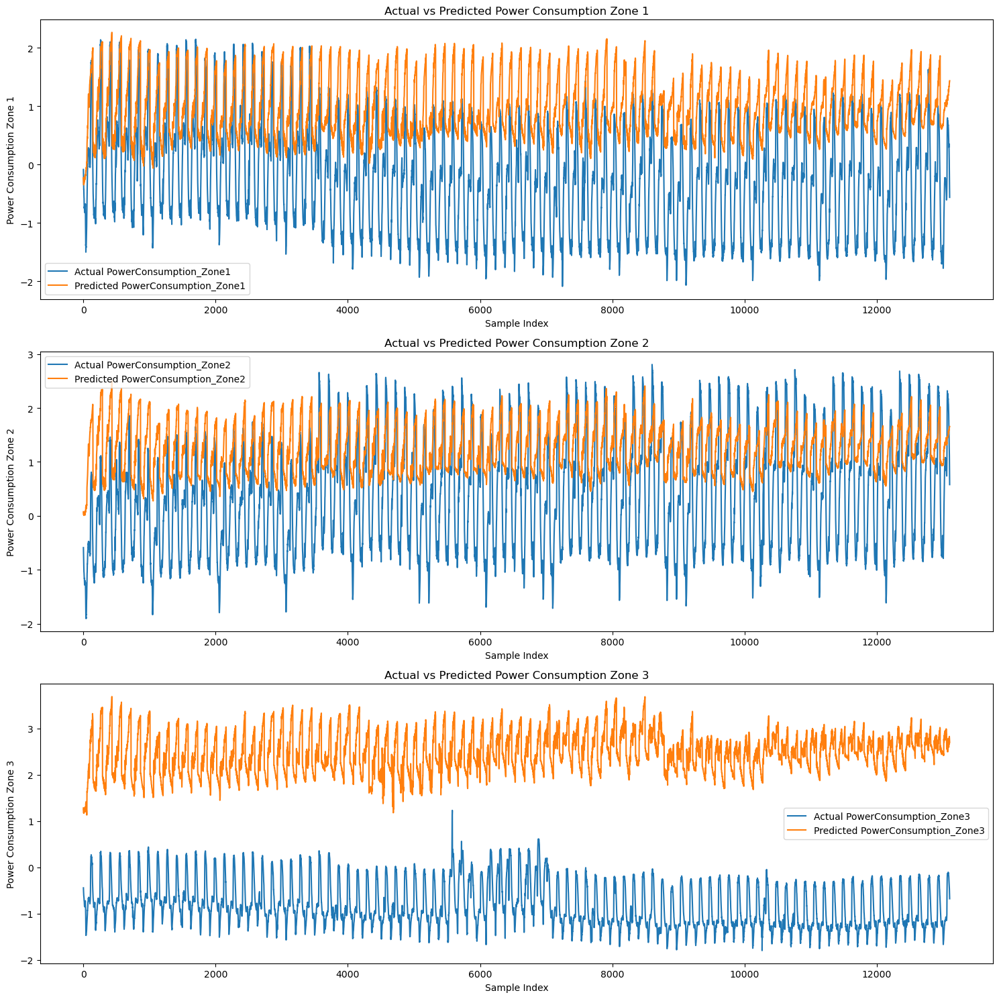

In [173]:
plot_power_consumption(y_test, test_pred_arima_scaled)

### Multilayer Perceptron Model

In [139]:
epochs = 100
batch_size = 32
lr = 0.001

model_mlp = Sequential([
    Dense(128, input_dim=X_train.shape[1]),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.3),
    Dense(64),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.3),
    Dense(3)
])

optimizer = Adam(learning_rate=lr)
model_mlp.compile(loss='mse', optimizer=optimizer)
model_mlp.summary()

lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss')

mlp_history = model_mlp.fit(
    X_train, y_train, 
    validation_data=(X_test, y_test),
    epochs=epochs,
    batch_size=batch_size,
    callbacks=[lr_scheduler, early_stopping, model_checkpoint],
    verbose=2
)

test_predict = model_mlp.predict(X_test)

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_20 (Dense)            (None, 128)               3456      
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 128)               0         
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_21 (Dense)            (None, 64)                8256      
                                                                 
 batch_normalization_1 (Batc  (None, 64)               256       
 hNormalization)                                      

In [140]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, test_predict)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.44827811794565414
RMSE: 0.6695357480714933
MAE: 0.5207898415340203
R²: 0.1761710202622627
MAPE: 292.4131274360812%
MBE: 0.07130728040544583


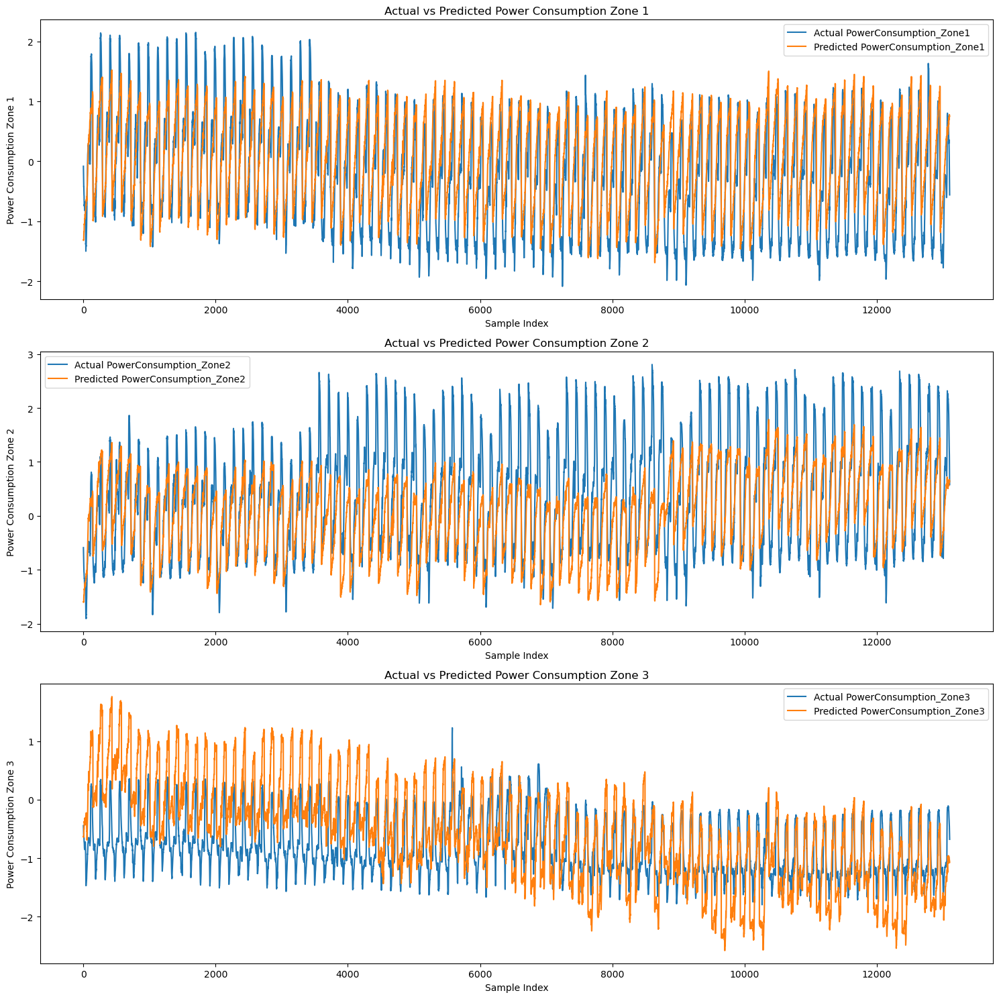

In [141]:
plot_power_consumption(y_test, test_predict)

### Convolutional Neural Networks (CNNs)

In [145]:
X_train_series = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test_series = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
print('Train set shape', X_train_series.shape)
print('Validation set shape', X_test_series.shape)

# Model parameters
epochs = 100
batch_size = 32
lr = 0.001
# Build the model
model_cnn = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=256, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(3)
])

# Compile the model
optimizer = Adam(learning_rate=lr)
model_cnn.compile(loss='mse', optimizer=optimizer)
model_cnn.summary()

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-6)
model_checkpoint = ModelCheckpoint('best_cnn_model.h5', save_best_only=True, monitor='val_loss')

# Train the model
CNN = model_cnn.fit(
    X_train_series, y_train,
    validation_data=(X_test_series, y_test),
    epochs=epochs,
    batch_size=batch_size,
    callbacks=[early_stopping, lr_scheduler, model_checkpoint],
    verbose=2
)

# Make predictions
test_predict_CNN = model_cnn.predict(X_test_series)

Train set shape (39312, 26, 1)
Validation set shape (13104, 26, 1)
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 24, 64)            256       
                                                                 
 batch_normalization_2 (Batc  (None, 24, 64)           256       
 hNormalization)                                                 
                                                                 
 max_pooling1d (MaxPooling1D  (None, 12, 64)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 10, 128)           24704     
                                                                 
 batch_normalization_3 (Batc  (None, 10, 128)          512       
 hNormalization)                                     

In [146]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, test_predict_CNN)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.4143946770733034
RMSE: 0.6437349431818219
MAE: 0.5034910795081428
R²: 0.3126388836646707
MAPE: 228.59931331429397%
MBE: 0.026095331856327307


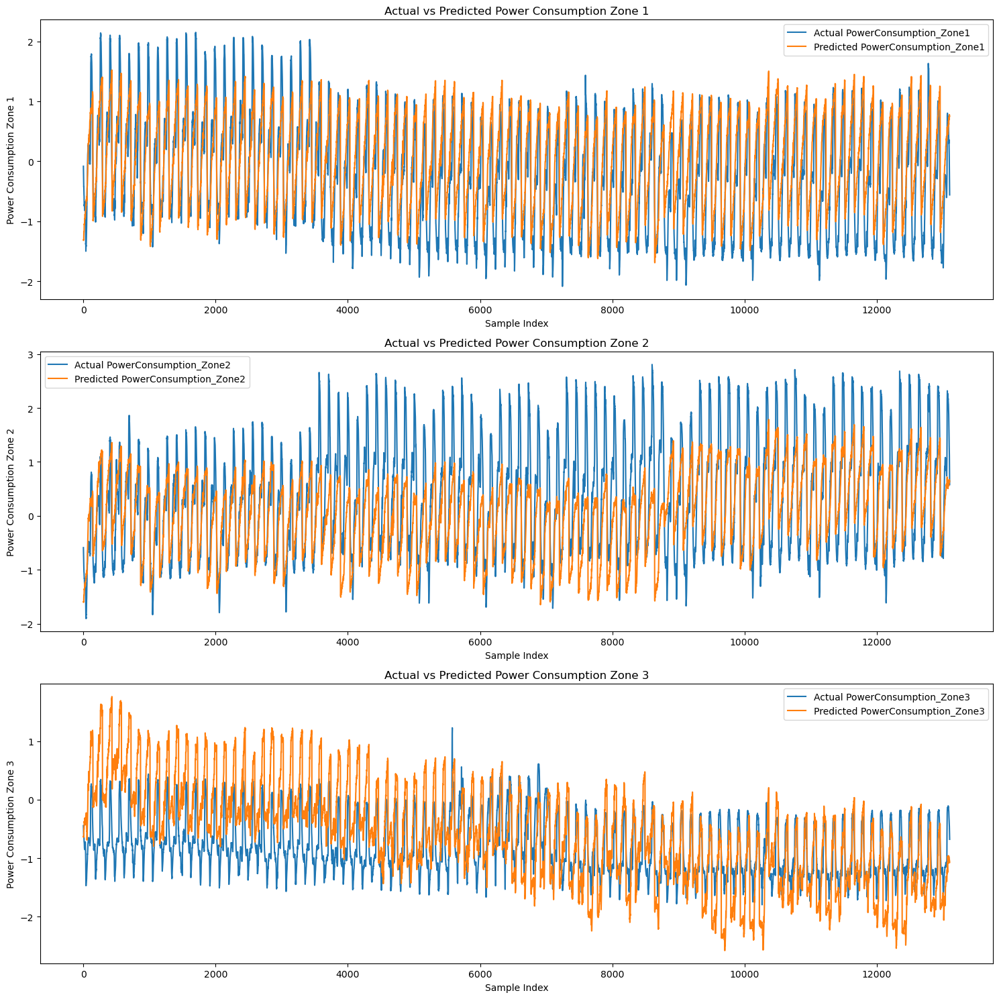

In [147]:
plot_power_consumption(y_test, y_test_pred_ensemble)

### Long Short-Term Memory Networks (LSTMs)

In [153]:
model_lstm = Sequential()
model_lstm.add(LSTM(50, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
model_lstm.add(Dense(3))
model_lstm.compile(loss='mse', optimizer=adam)
model_lstm.summary()
lstm_history = model_lstm.fit(X_train_series, y_train, validation_data=(X_test_series, y_test), epochs=epochs, verbose=2)
test_predict_LSTM = model_lstm.predict(X_test)

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 50)                10400     
                                                                 
 dense_35 (Dense)            (None, 3)                 153       
                                                                 
Total params: 10,553
Trainable params: 10,553
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200


1229/1229 - 40s - loss: 0.4657 - val_loss: 0.6000 - 40s/epoch - 33ms/step
Epoch 2/200
1229/1229 - 30s - loss: 0.3030 - val_loss: 0.5533 - 30s/epoch - 24ms/step
Epoch 3/200
1229/1229 - 25s - loss: 0.2515 - val_loss: 0.5077 - 25s/epoch - 21ms/step
Epoch 4/200
1229/1229 - 17s - loss: 0.2232 - val_loss: 0.4489 - 17s/epoch - 14ms/step
Epoch 5/200
1229/1229 - 19s - loss: 0.2046 - val_loss: 0.4562 - 19s/epoch - 16ms/step
Epoch 6/200
1229/1229 - 19s - loss: 0.1893 - val_loss: 0.4119 - 19s/epoch - 15ms/step
Epoch 7/200
1229/1229 - 18s - loss: 0.1722 - val_loss: 0.4211 - 18s/epoch - 15ms/step
Epoch 8/200
1229/1229 - 18s - loss: 0.1612 - val_loss: 0.4157 - 18s/epoch - 14ms/step
Epoch 9/200
1229/1229 - 18s - loss: 0.1479 - val_loss: 0.4493 - 18s/epoch - 14ms/step
Epoch 10/200
1229/1229 - 18s - loss: 0.1406 - val_loss: 0.4433 - 18s/epoch - 14ms/step
Epoch 11/200
1229/1229 - 18s - loss: 0.1331 - val_loss: 0.4037 - 18s/epoch - 14ms/step
Epoch 12/200
1229/1229 - 17s - loss: 0.1256 - val_loss: 0.4160 -

In [154]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, test_predict_LSTM)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.4734995824213975
RMSE: 0.6881130593306579
MAE: 0.5487880186132988
R²: 0.12721644466295115
MAPE: 336.7725052643655%
MBE: 0.07924010449463333


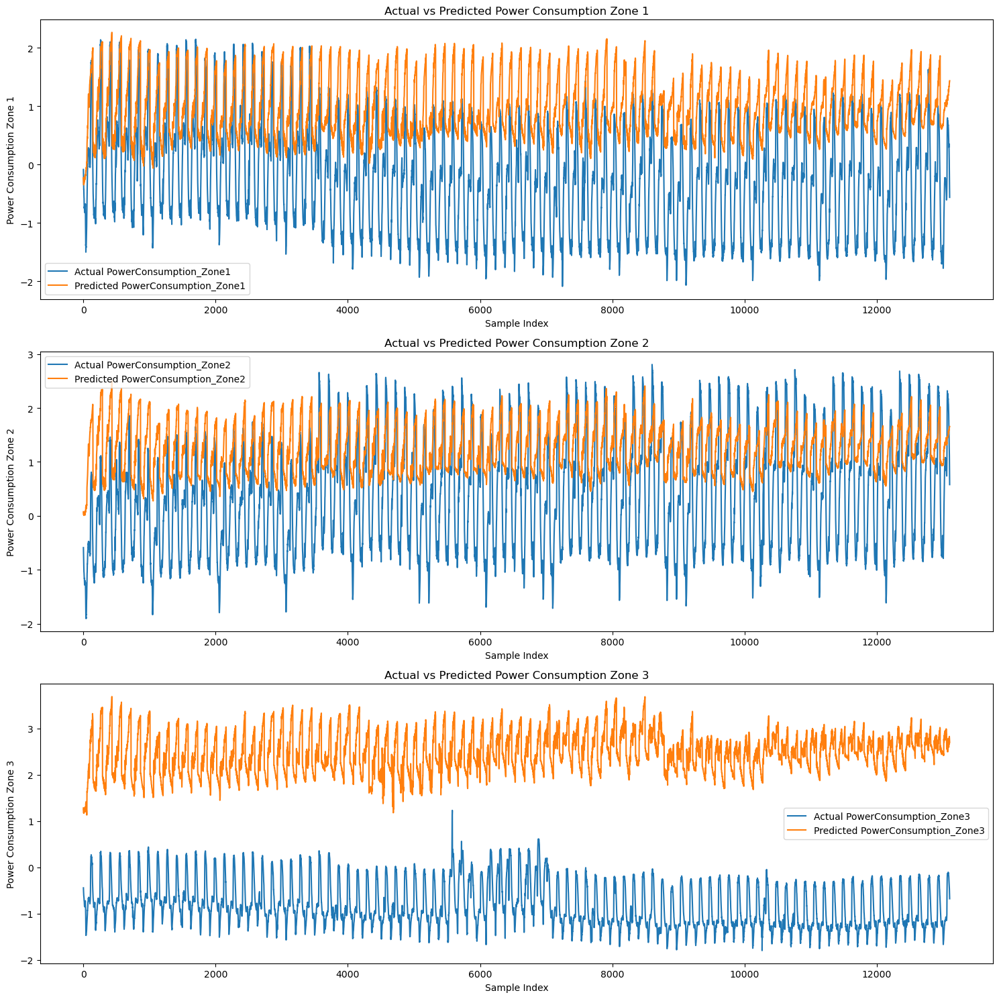

In [155]:
plot_power_consumption(y_test, test_predict_LSTM)

### Esembler Model

In [129]:
# Define the base models
base_models = [
    ('ridge', Ridge(alpha=1.0)),
    ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=0)),
    ('gbr', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=0)),
    ('svr', SVR(kernel='rbf', C=0.1, epsilon=0.01))
]

# Define the stacking ensemble model
ensemble_model = StackingRegressor(
    estimators=base_models,
    final_estimator=Ridge(alpha=1.0)  # Meta-model
)

# Wrap in MultiOutputRegressor to handle multiple output targets
model = MultiOutputRegressor(ensemble_model)

# Train the ensemble model
model.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred_ensemble = model.predict(X_test)

In [130]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_test_pred_ensemble)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 0.3290722585726806
RMSE: 0.5736482010541658
MAE: 0.45789877692339287
R²: 0.46680070193087725
MAPE: 235.53476240763192%
MBE: 0.06633048953368263


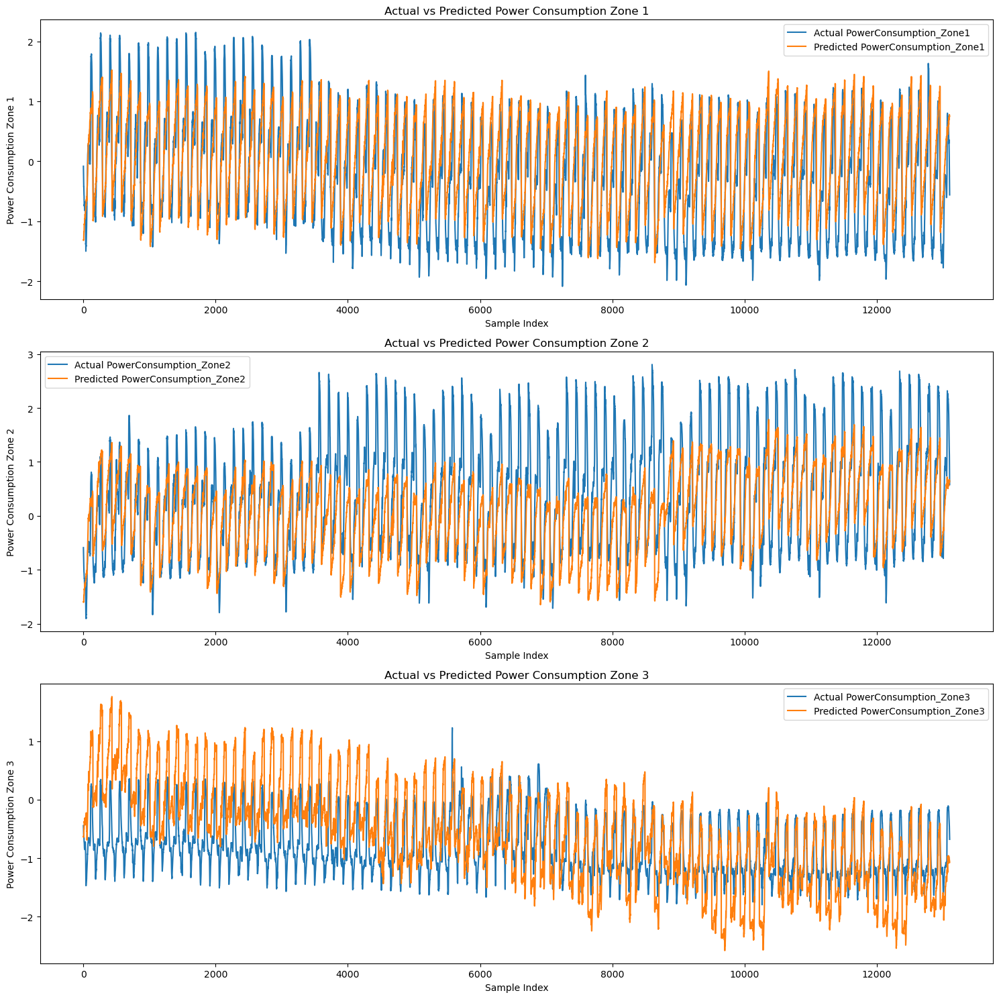

In [132]:
plot_power_consumption(y_test, y_test_pred_ensemble)

## Artificial Neural Network

### Backpropagation Neural Networks (BPNN)

In [149]:
# Model parameters
epochs = 200
batch_size = 32
learning_rate = 0.001

# Build the BPNN model
model = Sequential([
    Dense(128, input_dim=X_train.shape[1], activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(32, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(y_train.shape[1])
])


# Compile the model
optimizer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-6)
model_checkpoint = ModelCheckpoint('best_bpnn_model.h5', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[early_stopping, lr_scheduler, model_checkpoint],
    verbose=1
)

# Make predictions
#y_train_pred = model.predict(X_train)
y_test_pred_BPNN = model.predict(X_test)

Epoch 1/200
983/983 [==============================] - 12s 7ms/step - loss: 0.6951 - val_loss: 1.4323 - lr: 0.0010
Epoch 2/200
983/983 [==============================] - 4s 5ms/step - loss: 0.2986 - val_loss: 1.9500 - lr: 0.0010
Epoch 3/200
983/983 [==============================] - 4s 5ms/step - loss: 0.2452 - val_loss: 2.7520 - lr: 0.0010
Epoch 4/200
983/983 [==============================] - 5s 5ms/step - loss: 0.2136 - val_loss: 3.1932 - lr: 0.0010
Epoch 5/200
983/983 [==============================] - 5s 5ms/step - loss: 0.1928 - val_loss: 3.4274 - lr: 0.0010
Epoch 6/200
983/983 [==============================] - 5s 5ms/step - loss: 0.1815 - val_loss: 3.4218 - lr: 0.0010
Epoch 7/200
983/983 [==============================] - 5s 5ms/step - loss: 0.1700 - val_loss: 3.6034 - lr: 0.0010
Epoch 8/200
983/983 [==============================] - 5s 5ms/step - loss: 0.1640 - val_loss: 3.0576 - lr: 0.0010
Epoch 9/200
983/983 [==============================] - 5s 5ms/step - loss: 0.1580 - val

In [150]:
mse, rmse, mae, r2, mape, mbe = evaluate(y_test, y_test_pred_BPNN)
print("\nTest Data Evaluation:")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")
print(f"MAPE: {mape}%")
print(f"MBE: {mbe}")


Test Data Evaluation:
MSE: 3.2509284006868278
RMSE: 1.8030331113672948
MAE: 1.497108726219942
R²: -10.023153865417763
MAPE: 1017.4380432798769%
MBE: 1.4212661089038858


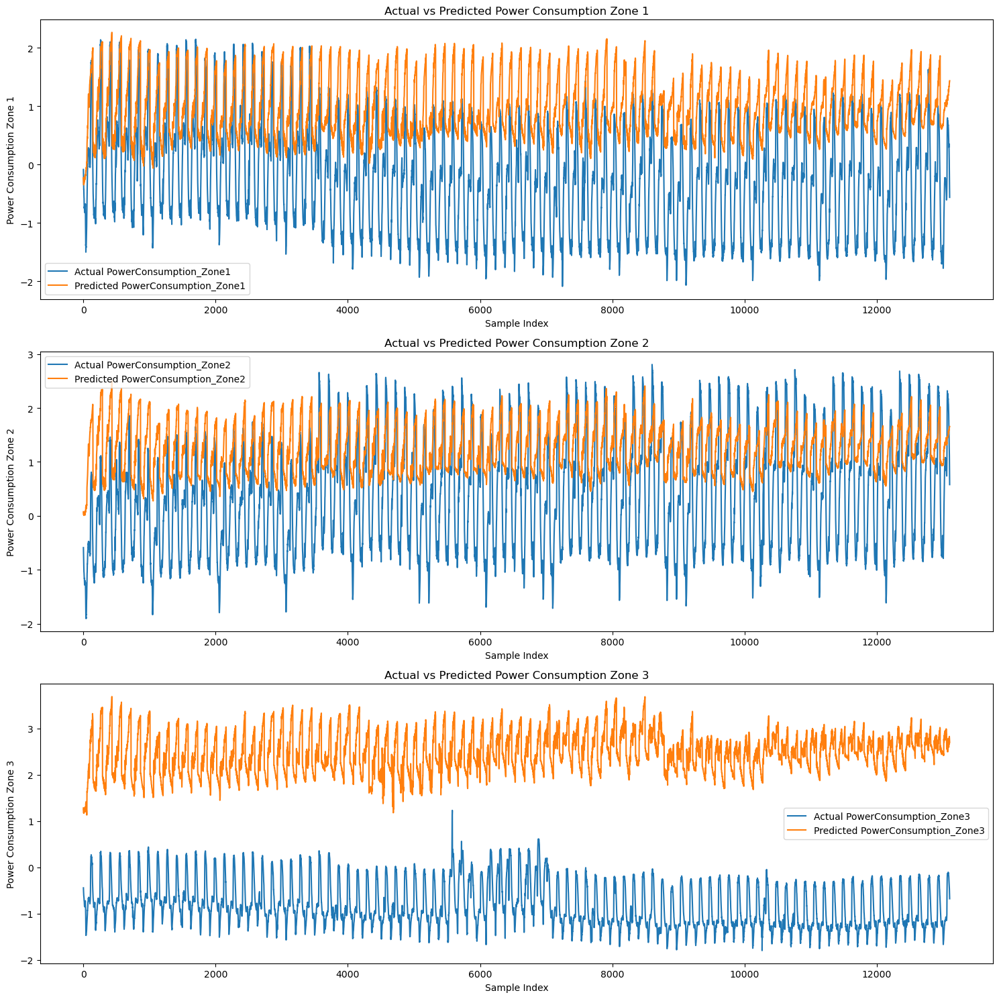

In [151]:
plot_power_consumption(y_test, y_test_pred_BPNN)

### Radial Basis Function Neural Networks (RBFNN)

### General Regression Neural Networks (GRNN)

### Feedforward Neural Networks (FFNN)

### Adaptive Network-Based Fuzzy Inference System (ANFIS)

## Feature Importance

In [ ]:
# Get absolute coefficients
    abs_coeffs = np.abs(model.params)